In [ ]:
# -*- coding: utf-8 -*-

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]=""

In [2]:
from tensorflow.python.keras.models import load_model, Sequential
from tensorflow.python.keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Activation,GlobalAveragePooling2D
from tensorflow.python.keras.optimizers import Adam, SGD
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.metrics import top_k_categorical_accuracy
from tensorflow.python.keras.applications import InceptionV3
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

In [3]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [4]:
test_dir_name = '../testing'

In [5]:
cat_code_kr = {
    1: '디지털/가전',
    8: '가구/인테리어',
    4: '유아동/유아도서',
    7: '생활/가공식품',
    5: '여성의류',
    31: '여성잡화',
    6: '뷰티/미용',
    14: '남성패션/잡화',
    3: '스포츠/레져',
    2: '게임/취미',
    9: '도서/티켓/음반',
    16: '반려동물용품',
    13: '기타',
    32: '삽니다',
    10: '중고차/오토바이',
    33: '동네 구인구직',
    12: '부동산',
    55: '농수산물',
    11: '과외/클래스',
    60: '전시/공연/행사'
    }
# 카테고리 코드 -> 카테고리 명
cat_code = {
    1: 'ditital/appliances',
    8: 'furniture/interior',
    4: 'kids/kids book',
    7: 'living/processed food',
    5: 'women\'s clothes',
    31: 'women\'s etc',
    6: 'beauty',
    14: 'men\'s',
    3: 'sports/leisure',
    2: 'game/hobby',
    9: 'book/ticket/cd',
    16: 'pet',
    }

# 카테고리 코드 -> 클래스 라벨
cls_idx = {
   'b': 0,
   'beauty': 1,
   'book_ticket_cd': 2,
   'digital_appliances': 3,
   'furniture_interior': 4,
   'game_hobby': 5,
   'kids_kids_book': 6,
   'living_processed_food': 7,
   'mens': 8,
   'pet': 9,
   'sports_leisure': 10,
   'womens_clothes': 11,
   'womens_etc': 12,
  }

# 클레스 라벨 -> 카테고리 코드
idx_cls_kr = {i:x for x,i in cat_code_kr.items()}

In [6]:
datagen_test = ImageDataGenerator(rescale=1./255)

In [7]:
batch_size = 256

In [13]:
generator_test = datagen_test.flow_from_directory(directory=test_dir_name,
                                                  target_size=(224,224),
                                                  batch_size=batch_size,
                                                  shuffle=False
                                                  )


Found 186533 images belonging to 19 classes.


In [14]:
generator_test.class_indices

{'agricultural': 0,
 'beauty': 1,
 'book_ticket_cd': 2,
 'concert_event': 3,
 'digital_appliances': 4,
 'furniture_interior': 5,
 'game_hobby': 6,
 'job': 7,
 'kids_kids_book': 8,
 'living_processed_food': 9,
 'mens': 10,
 'motorbike': 11,
 'pet': 12,
 'real_estate': 13,
 'smb': 14,
 'sports_leisure': 15,
 'tuition_class': 16,
 'womens_clothes': 17,
 'womens_etc': 18}

In [15]:
step_size = generator_test.n/batch_size + 1

In [16]:
def top_3_accuracy(true, pred):
    return top_k_categorical_accuracy(true, pred, 3)
model = load_model('./checkpoint/xception_ft-0003-0.89.h5', custom_objects={'top_3_accuracy':top_3_accuracy})

In [17]:
cls_pred = model.predict_generator(generator_test, steps=step_size, verbose=1)

729/729 [==============================] - 12758s 18s/step


In [18]:
label = np.sort(generator_test.class_indices.values())
label_actual = np.sort(generator_test.class_indices.keys())

In [23]:
cls_test = generator_test.classes
cls_pred_classes = cls_pred.argsort(axis=1)

In [19]:
idx_cls = {v:k for k,v in generator_test.class_indices.items()}

In [20]:
idx_cls

{0: 'agricultural',
 1: 'beauty',
 2: 'book_ticket_cd',
 3: 'concert_event',
 4: 'digital_appliances',
 5: 'furniture_interior',
 6: 'game_hobby',
 7: 'job',
 8: 'kids_kids_book',
 9: 'living_processed_food',
 10: 'mens',
 11: 'motorbike',
 12: 'pet',
 13: 'real_estate',
 14: 'smb',
 15: 'sports_leisure',
 16: 'tuition_class',
 17: 'womens_clothes',
 18: 'womens_etc'}

In [21]:
# helper functions

def path_join(dirname, img_paths):
  return [os.path.join(dirname, img_path) for img_path in img_paths]

def print_confusion_matrix(cls_test, cls_pred, label, label_actual):
  
  cm = confusion_matrix(y_true=cls_test,
                        y_pred=cls_pred.argmax(axis=1),
                        labels=label)
  true_pos = np.diag(cm)
  true_pos_false_pos = np.sum(cm, axis=0).astype(float)
  true_pos_false_neg = np.sum(cm, axis=1).astype(float)

  precision = true_pos / (true_pos_false_pos)
  recall = true_pos / (true_pos_false_neg)
  
  # please take care of divison by zero
  precision[np.isnan(precision)] = 0.0
  recall[np.isnan(recall)] = 0.0

  plt.figure(figsize=(20,10))
  sns.heatmap(cm, annot=True, xticklabels=label_actual, yticklabels=label_actual, fmt='g', cmap='terrain')

  plt.xlabel("predicted label")
  plt.ylabel("actual label")  
  for i, class_name in enumerate(label_actual):
    print("({0}) {1}: recall={2:.2f}, precision={3:.2f}".format(i, class_name , recall[i], precision[i]))

def load_images(image_paths):
  images = [plt.imread(path) for path in image_paths]
  return np.asarray(images)

def plot_images(images, cls_true, cls_pred):
  assert len(images) == len(cls_true)
  if len(images) == 0: return
  
  num_x_plot = int(np.ceil(len(images)/4))
  fig, axes = plt.subplots(num_x_plot , 4 , figsize=(22,len(images)))
  interpolation = 'spline16'
  
  fig.subplots_adjust(hspace=0.6)
  
  for i, ax in enumerate(axes.flat):
    if i < len(images):
      ax.imshow(images[i], interpolation=interpolation)
      cls_pred_name = cls_pred.argsort(axis=1)[i][-3:][::-1]
      cls_pred_prob = np.sort(cls_pred, axis=1)[i][-3:][::-1]
      cls_true_name = cls_true[i]
      xlabel = ""
      for idx, class_name in enumerate(cls_pred_name):
        xlabel += "Pred {} : {}, score: {:.04f} \n".format(idx, idx_cls[class_name], cls_pred_prob[idx])
      xlabel += "True:{}".format(idx_cls[cls_true_name])
      ax.set_xlabel(xlabel, fontsize=15.0)
    ax.set_xticks([])
    ax.set_yticks([])
  plt.tight_layout()
  plt.show()
  

def print_errors(class_name):
  generator_test.reset()

  cls_pred_argmax = cls_pred.argmax(axis=1) # 예측 클래스 어래이
  incorrect = (cls_pred_argmax != cls_test) # 틀린 예측 인덱스
  true_incorrect = cls_test[incorrect]
  pred_incorrect = cls_pred_argmax[incorrect]
  
  pred_idx = np.argwhere(pred_incorrect == class_name).flatten() 
 
  print('예측 틀린 개수:{}'.format(len(pred_idx)))
  
  rdm_idx = np.random.randint(0, len(pred_idx), size=12)
  image_path = np.array(path_join(test_dir_name, generator_test.filenames))[incorrect][pred_idx][rdm_idx]
  image = load_images(image_path)
  
  true_incorrect = true_incorrect[pred_idx][rdm_idx]
  pred_incorrect = cls_pred[incorrect][pred_idx][rdm_idx]
  
  plot_images(images=image, cls_true=true_incorrect, cls_pred=pred_incorrect)
  

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in divide
  from ipykernel import kernelapp as app


(0) agricultural: recall=0.58, precision=0.59
(1) beauty: recall=0.82, precision=0.64
(2) book_ticket_cd: recall=0.67, precision=0.63
(3) concert_event: recall=0.00, precision=0.00
(4) digital_appliances: recall=0.81, precision=0.76
(5) furniture_interior: recall=0.71, precision=0.71
(6) game_hobby: recall=0.33, precision=0.52
(7) job: recall=0.30, precision=0.63
(8) kids_kids_book: recall=0.80, precision=0.79
(9) living_processed_food: recall=0.64, precision=0.61
(10) mens: recall=0.52, precision=0.64
(11) motorbike: recall=0.83, precision=0.83
(12) pet: recall=0.37, precision=0.71
(13) real_estate: recall=0.69, precision=0.65
(14) smb: recall=0.50, precision=0.48
(15) sports_leisure: recall=0.49, precision=0.63
(16) tuition_class: recall=0.20, precision=0.23
(17) womens_clothes: recall=0.00, precision=0.00
(18) womens_etc: recall=0.31, precision=0.03


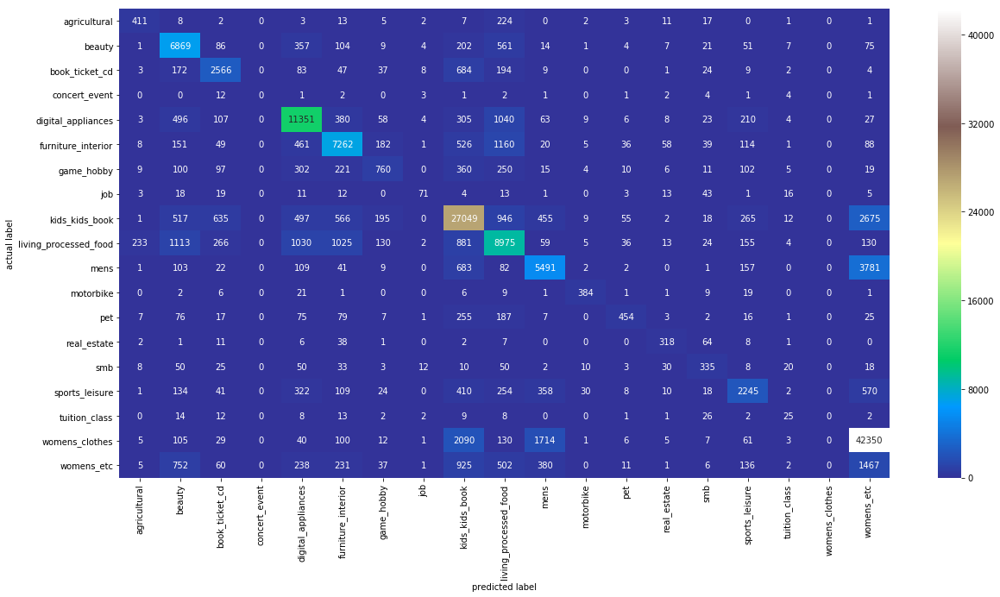

In [24]:
print_confusion_matrix(cls_test, cls_pred, label, label_actual)

예측 틀린 개수:3812


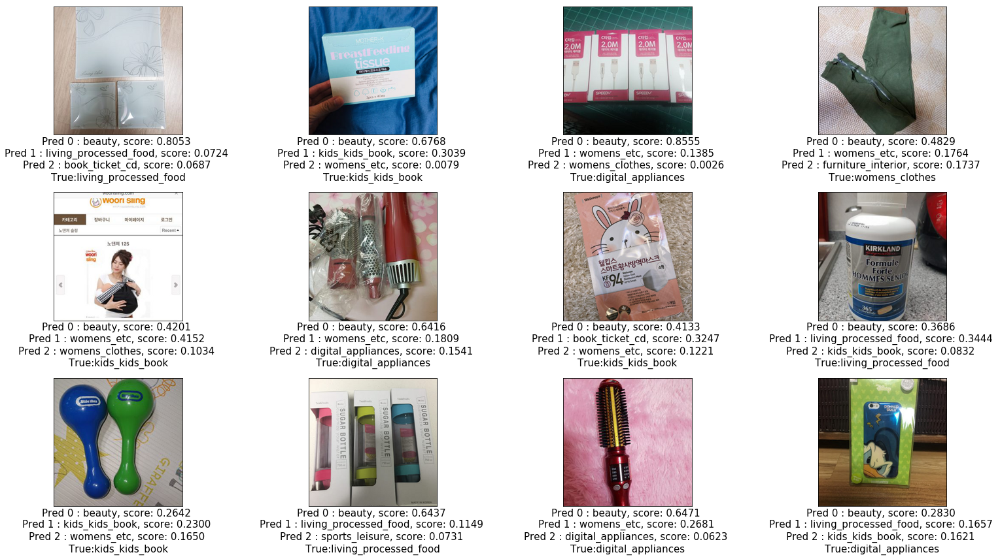

In [54]:
print_errors(1)

예측 틀린 개수:1496


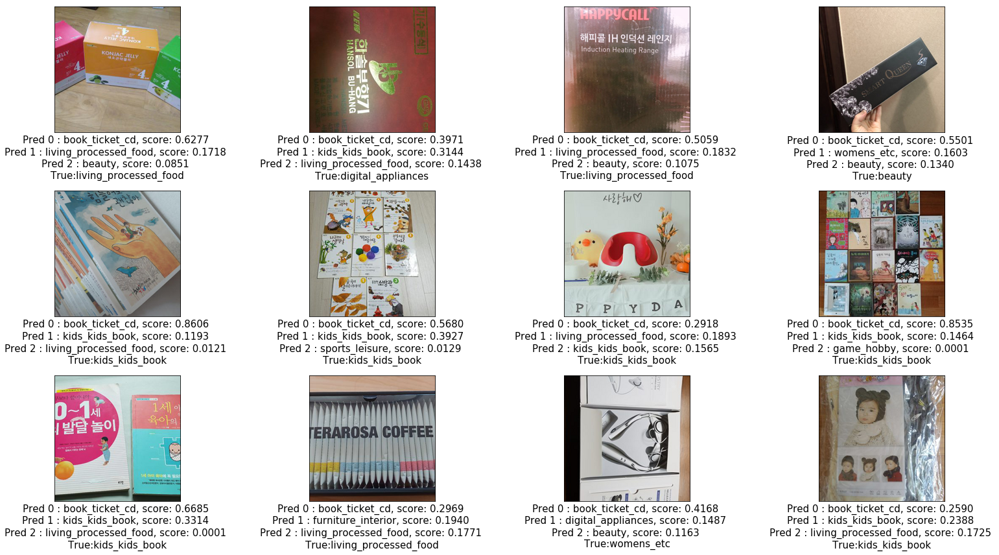

In [55]:
print_errors(2)

예측 틀린 개수:3614


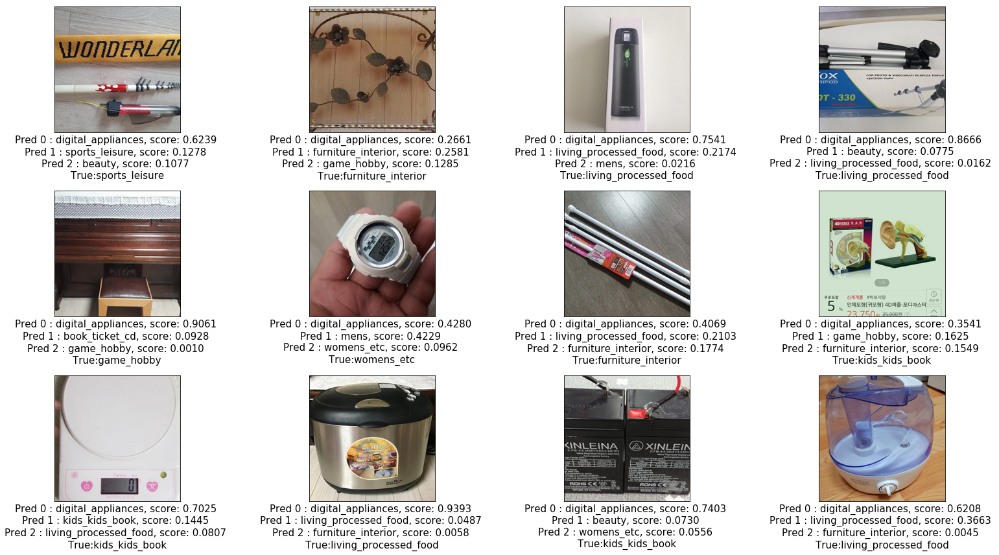

In [56]:
print_errors(4)

예측 틀린 개수:3015


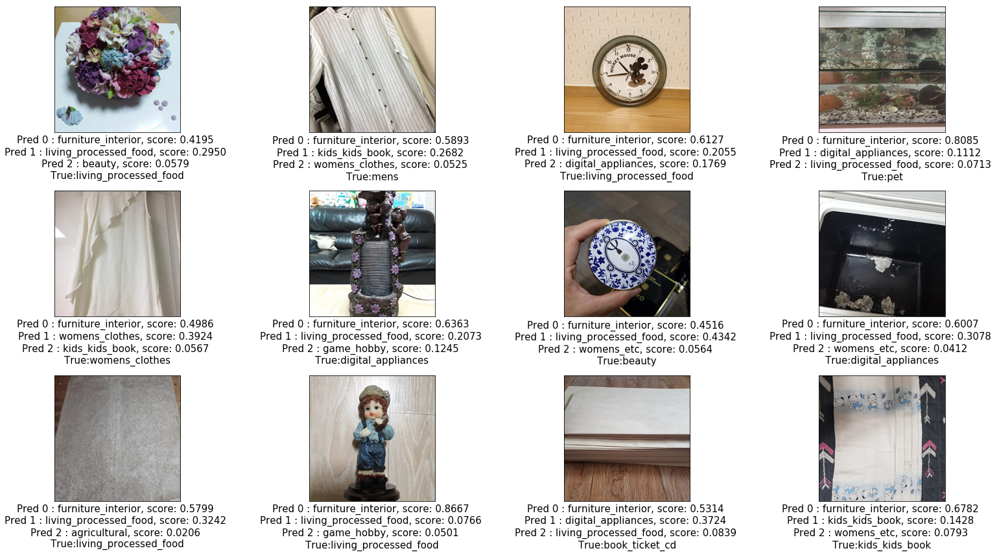

In [57]:
print_errors(5)

예측 틀린 개수:711


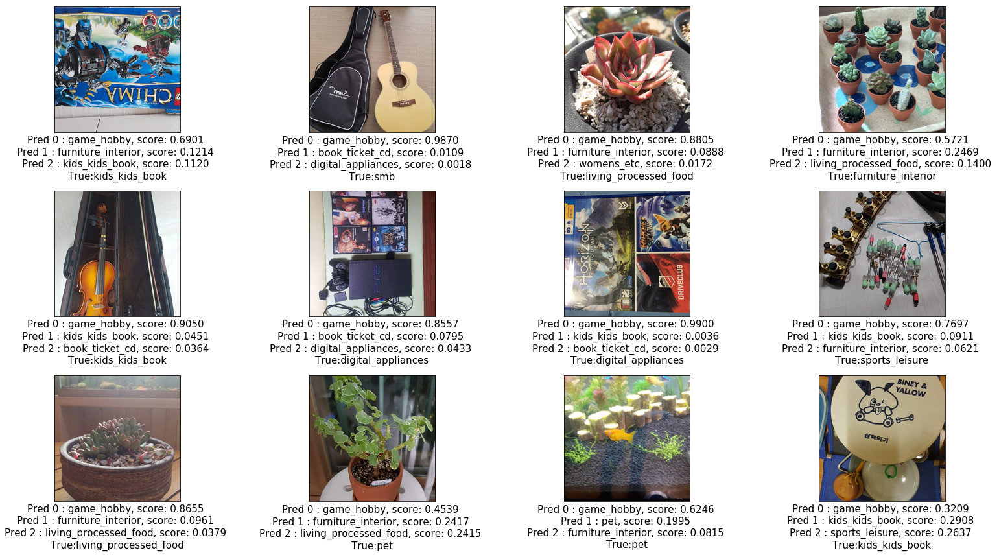

In [58]:
print_errors(6)

예측 틀린 개수:41


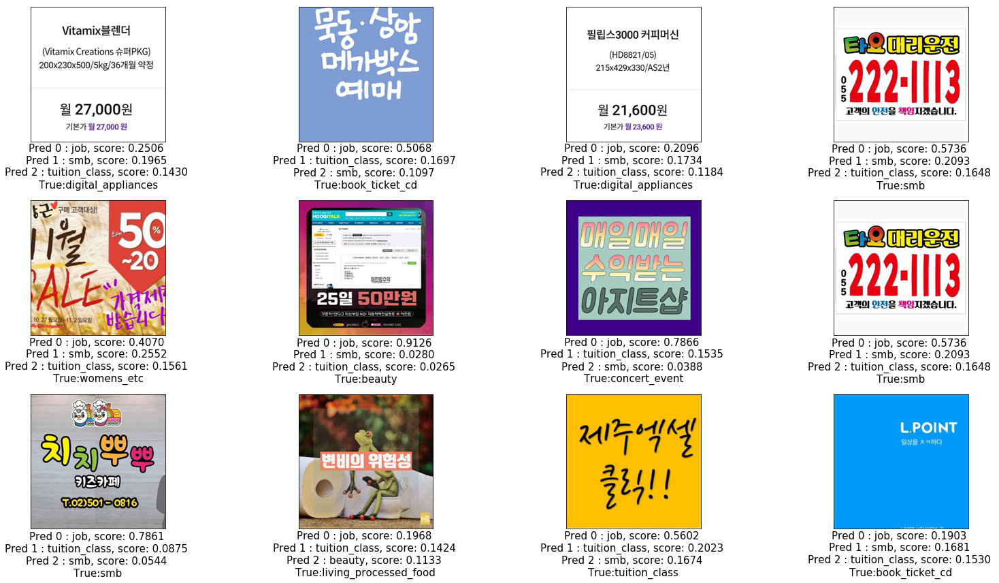

In [59]:
print_errors(7)

예측 틀린 개수:7359


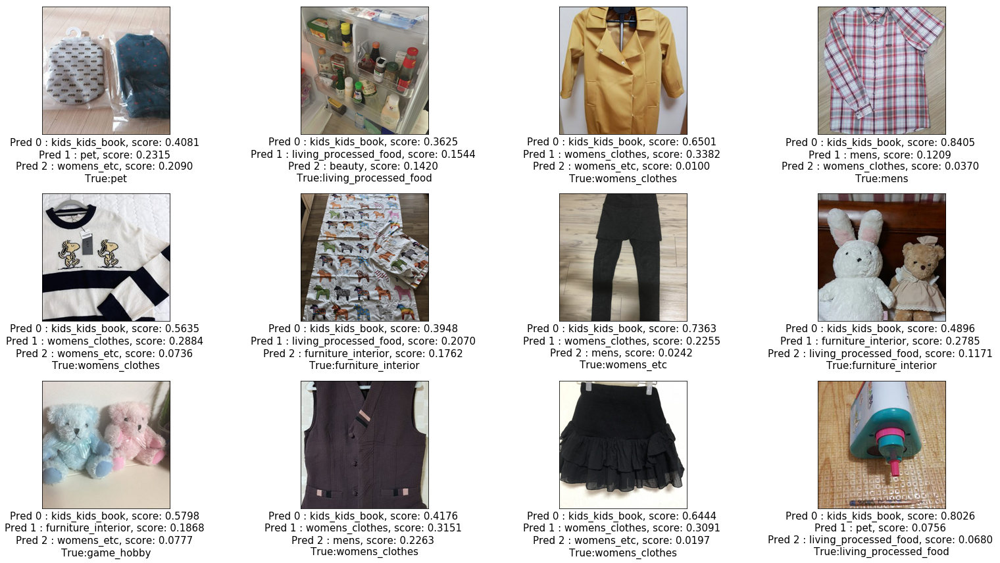

In [60]:
print_errors(8)

예측 틀린 개수:5620


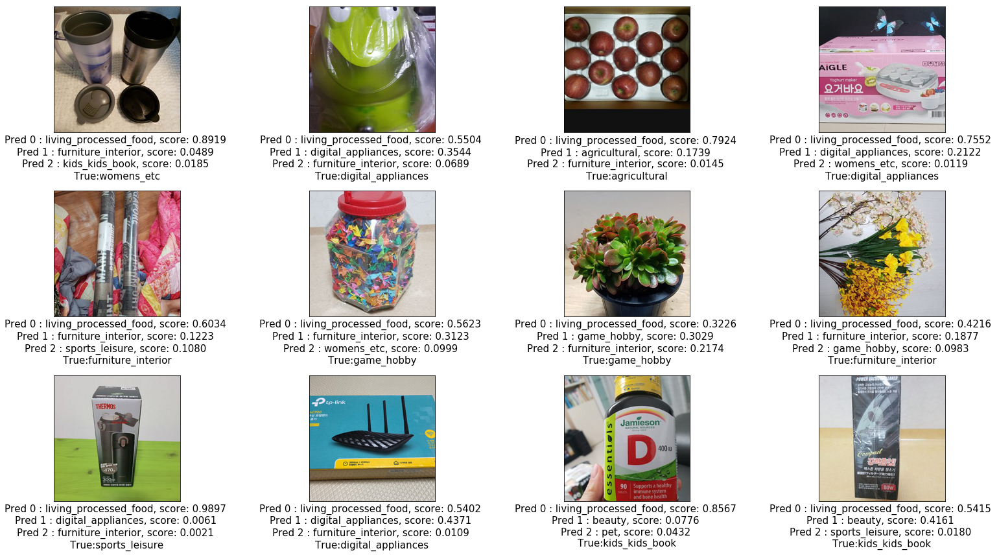

In [61]:
print_errors(9)

예측 틀린 개수:3099


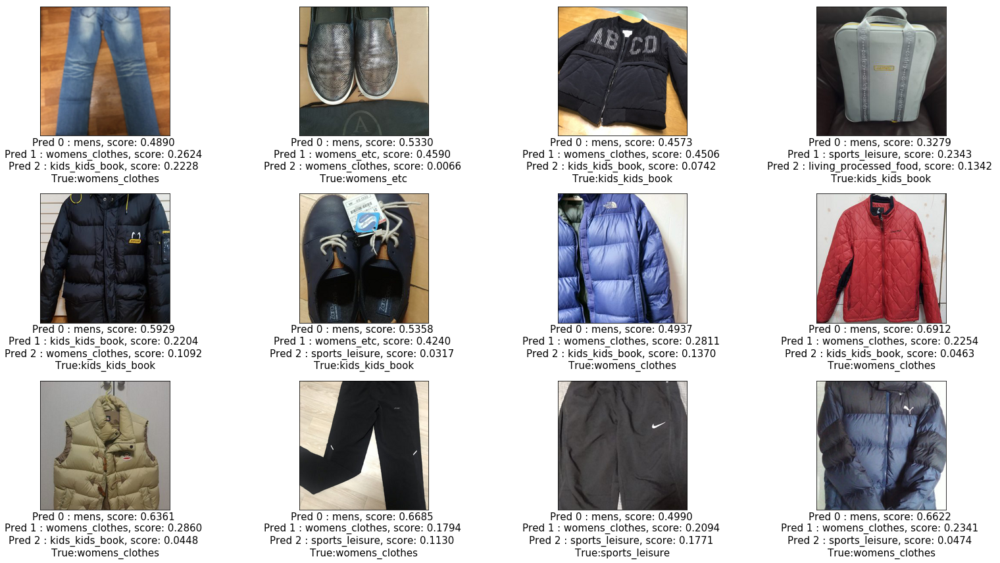

In [62]:
print_errors(10)

예측 틀린 개수:78


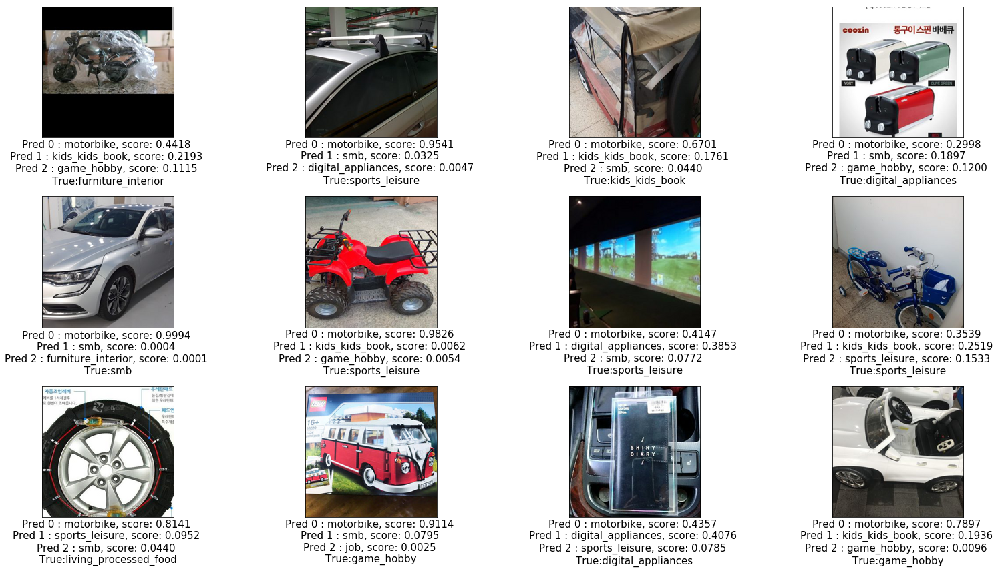

In [63]:
print_errors(11)

예측 틀린 개수:186


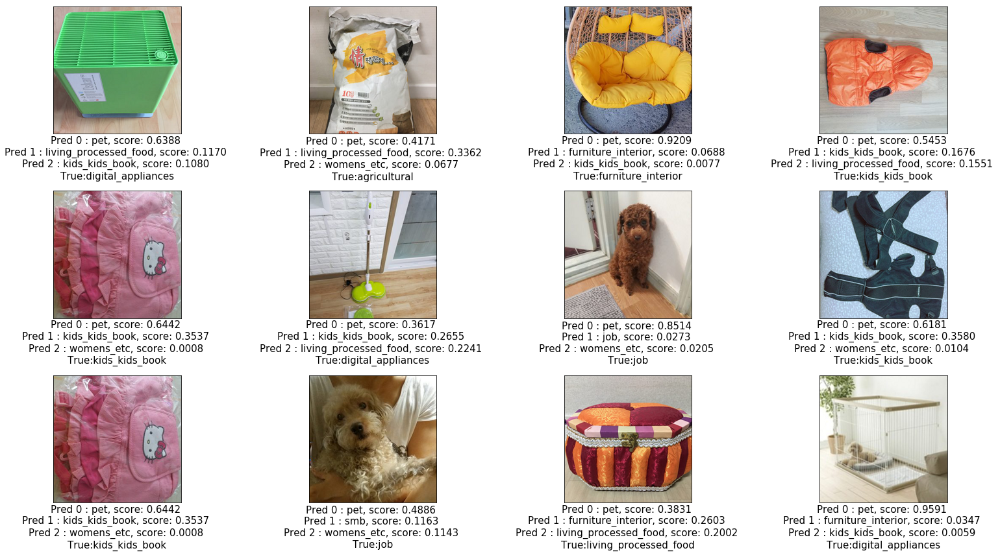

In [64]:
print_errors(12)

예측 틀린 개수:172


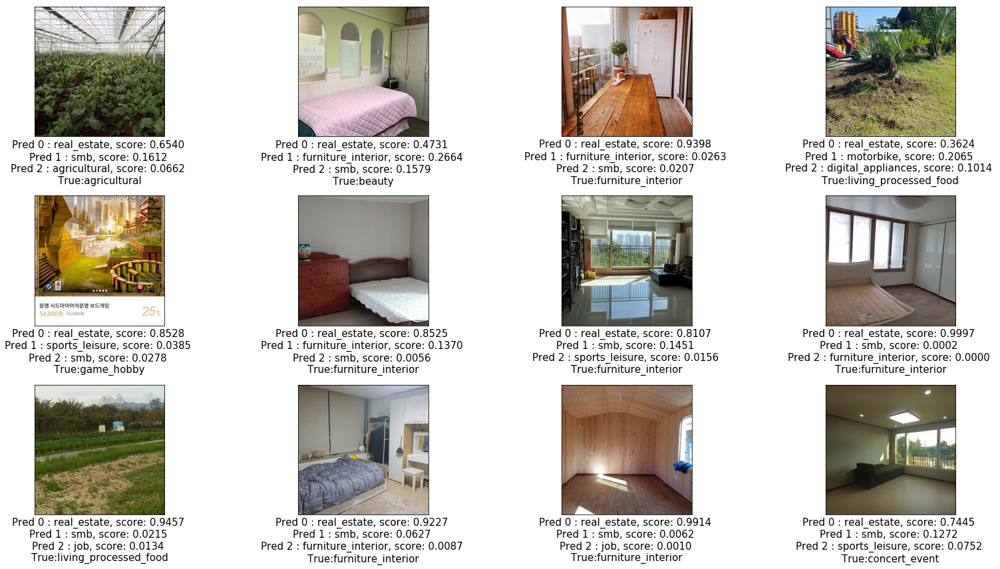

In [65]:
print_errors(13)

예측 틀린 개수:357


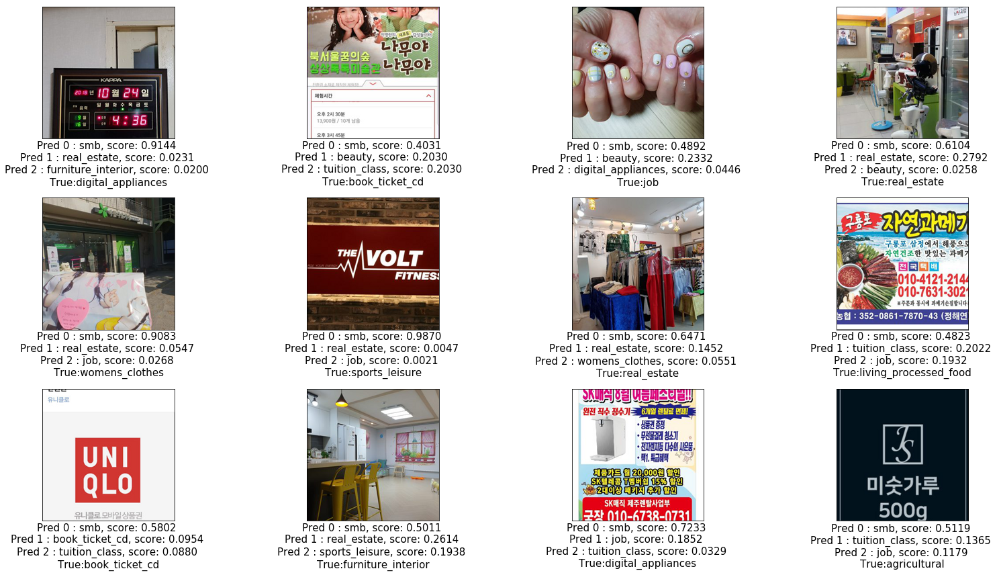

In [66]:
print_errors(14)

예측 틀린 개수:1315


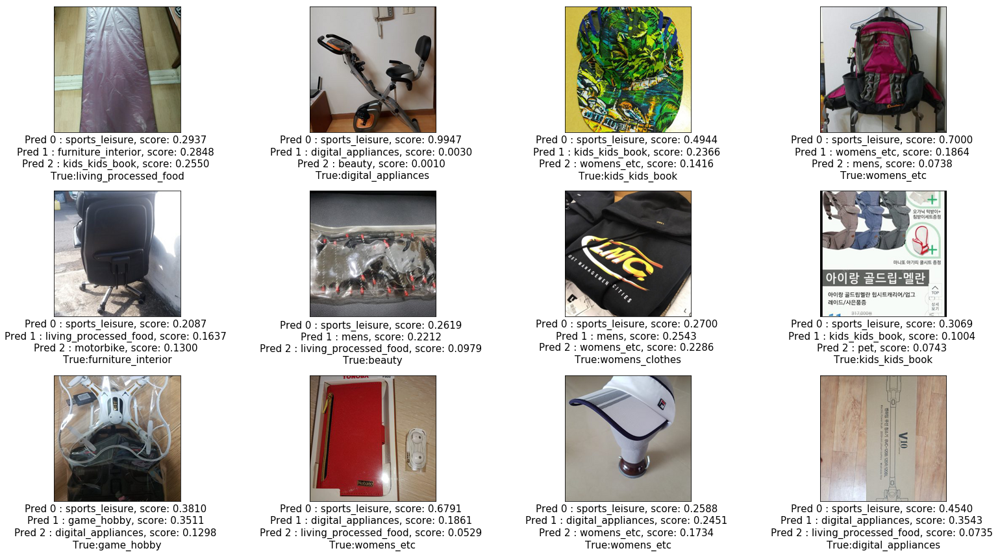

In [67]:
print_errors(15)

예측 틀린 개수:85


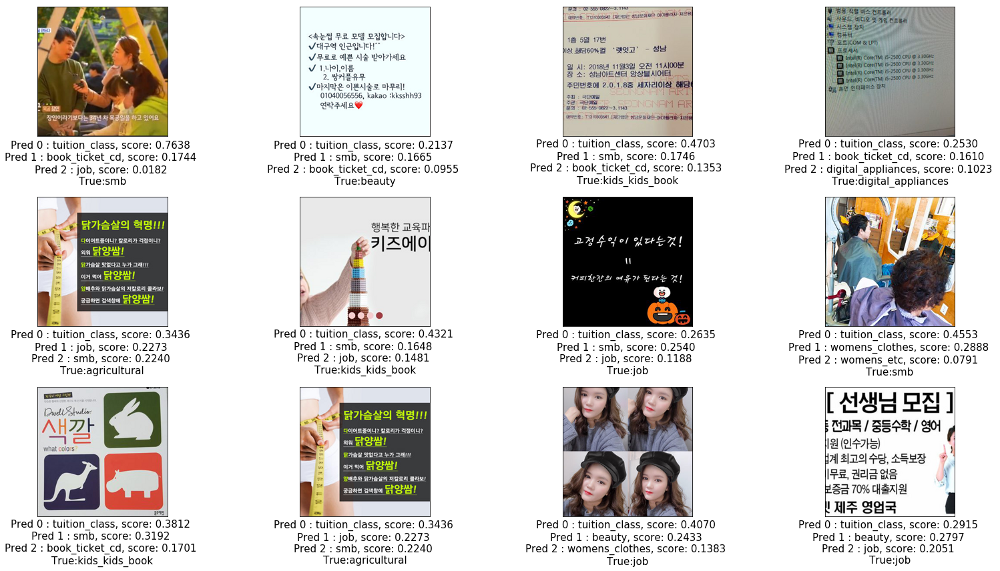

In [68]:
print_errors(16)

예측 틀린 개수:8889


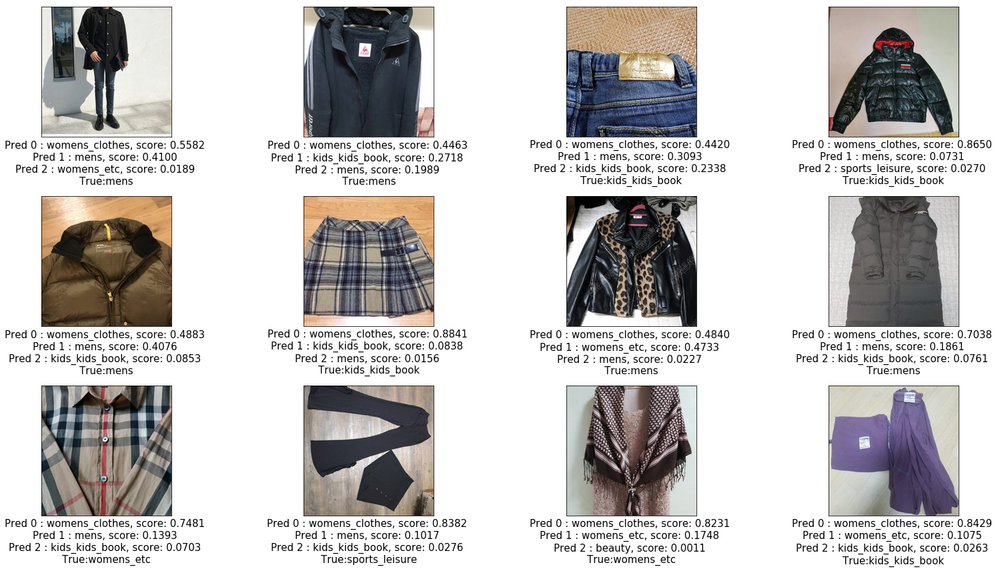

In [69]:
print_errors(18)

예측 틀린 개수:8975


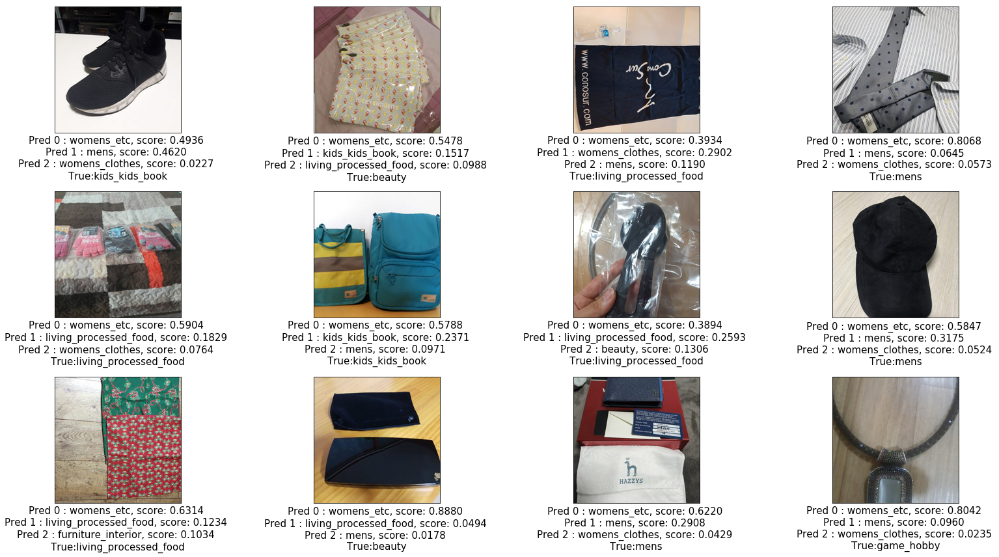

In [70]:
print_errors(19)

KeyboardInterrupt: 

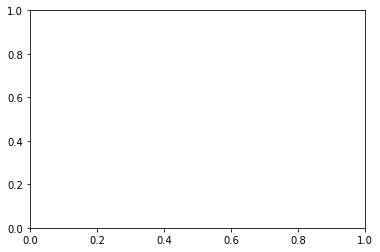

In [68]:
df_test = pd.DataFrame(cls_test, columns=['category_id'])
df_pred = pd.DataFrame(cls_pred.argmax(axis=1), columns=['category_id'])
df_test['pred/test'] = 'test'
df_pred['pred/test'] = 'pred'
df = pd.concat([df_test, df_pred], axis=0)

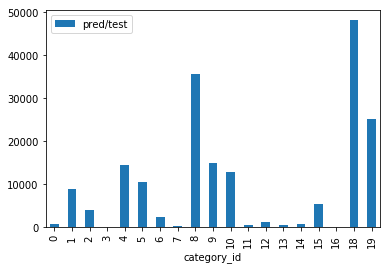

In [76]:
df_test.groupby('category_id').count().plot(kind='bar')

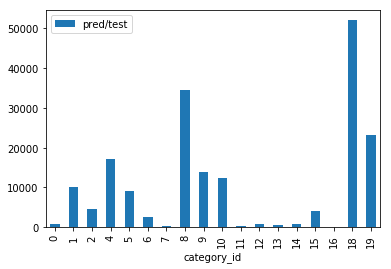

In [77]:
df_pred.groupby('category_id').count().plot(kind='bar')